##TP3 Graph-Cut Sacha Khosrowshahi
travail groupé avec Nathan Rouillé

## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 894.4/894.4 kB 13.3 MB/s eta 0:00:00


## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=1)$ (white class))?

Q2: Give the means and variances of the two classes (CF. code of Q8).

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

### A1  & A2
On remarque graphiquement que l'on peut approximer les distributions des histogrammes des 2 classes par des gaussiennes dont on calcule les moyennes et variance pour obtenir leurs distributions :
$Class_0 \sim \mathcal{N}(97,506)$  et $Class_1 \sim \mathcal{N}(164,513)$


## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3:
Le graph correspondant pour la recherche d'une coupe minimale avec une image à deux pixels aura 4 noeuds : un pour chaque pixel, un pour la source et un pour le puit. Les termes d'attachement aux données correspondent aux arcs allant de la source aux pixels : $\frac{(y_s-m_0)^2}{2\sigma^2}$ et ceux allant du puit aux pixels : $\frac{(y_s-m_1)^2}{2\sigma^2}$ (en pratique il n'est pas nécessaire de diviser par ${2\sigma^2}$).

L'arc allant du noeud $y_s$ à $y_t$ correspond au terme de régularisation qui aura donc le poids $\beta$, cela signifie que pour séparer 2 pixels adjacents dans 2 classes différentes il y a un "coût" de $\beta$

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5:

On obtient $\beta_{opt}$ = 1770

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6:

L'avantage majeur de l'algorithme Min Cut est le fait qu'on trouve un minimum global et non un minimum local comme dans l'ICM.
L'algorithme de Simulated Annealing quant à lui offre un minimum global mais est beaucoup plus lent que le Min Cut. En théorie le Min Cut et le simulated annealing devraient converger vers la même solution. Le Min Cut trouve une coupe minimale exacte tandis que le Simulated annealing devrait converger vers un minimum global mais seulement si les conditions initiales conviennent et la température est diminuée lentement (idéalement logarithmiquement).
Dans le cas général, en comparant le Simulated Annealing aux ICM ou descente de gradient l'avantage est qu'il ne se bloque pas dans des minimums locaux. En comparaison avec le Graph-Cut l'avantage est qu'il n'a pas un nombre limité de classes d'énérgies (2 pour Graph-Cut).


Q7: If we get different results between ICM and graph-cut, or between simulated annealing and graph-cut (if the conditions for the simulated annealing to give the global minima are not respected), how can you explain that the error rate with the true image can be lower with the ICM result of the simulated annealing one than with the graph-cut optimization?
  

**Your answer &#x270D;**

A7:

Cela s'explique par le fait que malgré la tendance de ICM et Simulated Annealing à se bloquer dans des minimas locaux, leur caractère itératif les rend plus sensibles aux détails. Ainsi même si Graph-Cut trouve le minimal global, il se peut qu'il ne retranscrive pas bien les détails et donc ait un taux d'erreur supérieur.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8:

Les avantages du modèle Ising : simple et rapide

Les désaventages : Seulement 2 états, peut se bloquer dans un minimum local et est sensible au bruit.

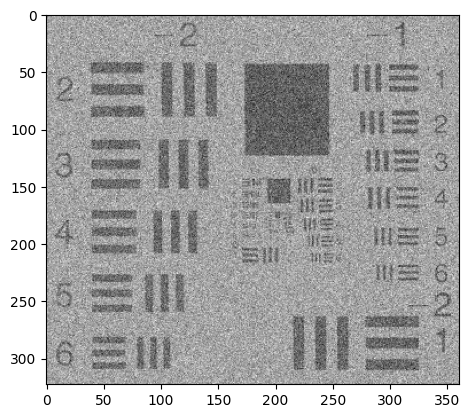

In [2]:
# Loading images
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

plt.imshow(im_obs,cmap='gray')

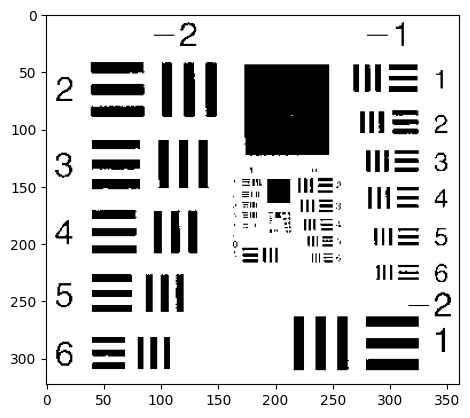

In [3]:
plt.imshow(im_orig, cmap='gray')

In [12]:
#### to be completed
# TO BE COMPLETED EX1
# /!\ beta, m0 and m1 must be floats to avoid some issues. For example: "beta = 1.".
crop_classe0=im_obs[60:100,200:240]
crop_classe1=im_obs[230:300,130:200]
beta = 950. # beta value
m0 = np.mean(crop_classe0)# m0 and m1 values from the previous practical work
m1 = np.mean(crop_classe1)

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
map_Us_0 = (im_obs - m0)**2
map_Us_1 = (im_obs - m1)**2
g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


Max Flow: 68608503.30073771


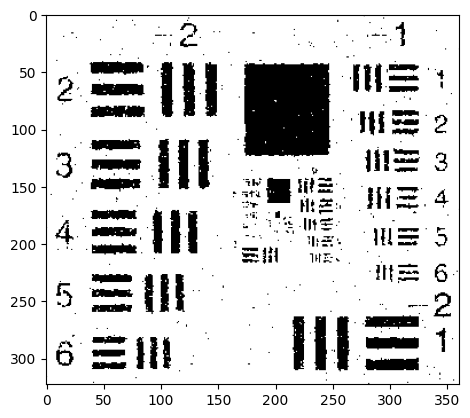

In [4]:
plt.imshow(im_bin,cmap='gray')

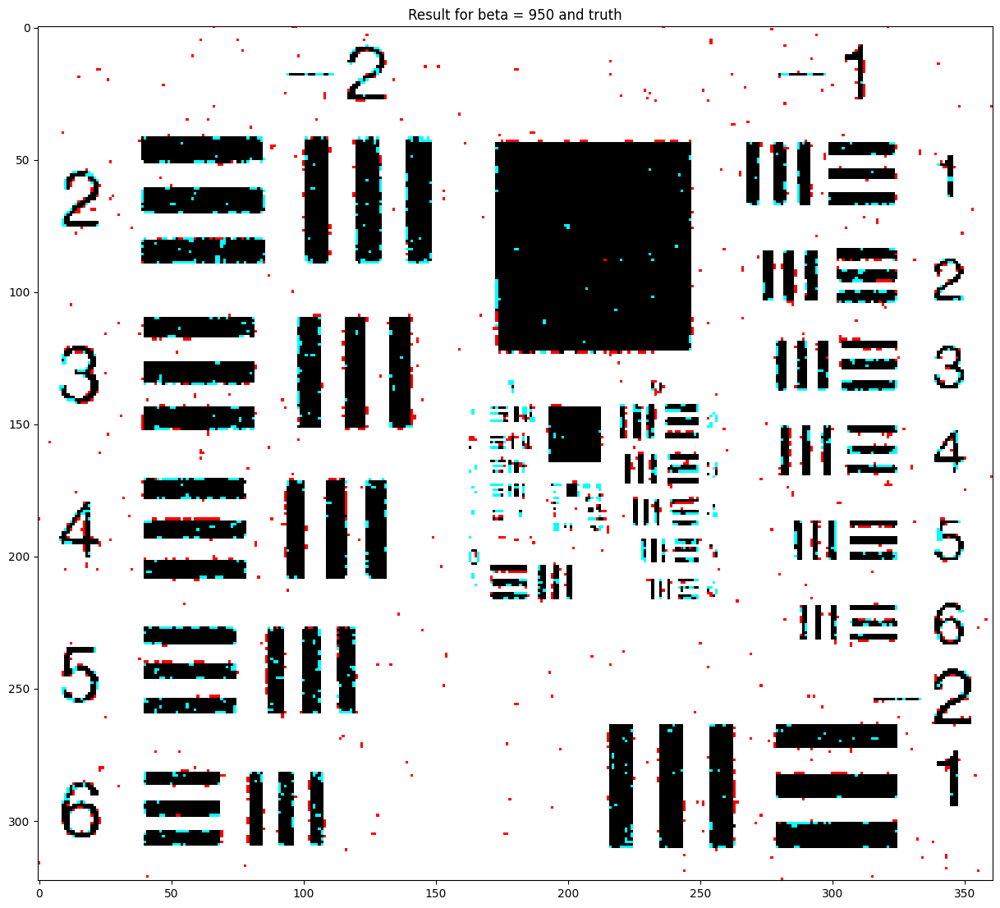

Number of misclassified pixels for beta =  950 :  2862


In [5]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

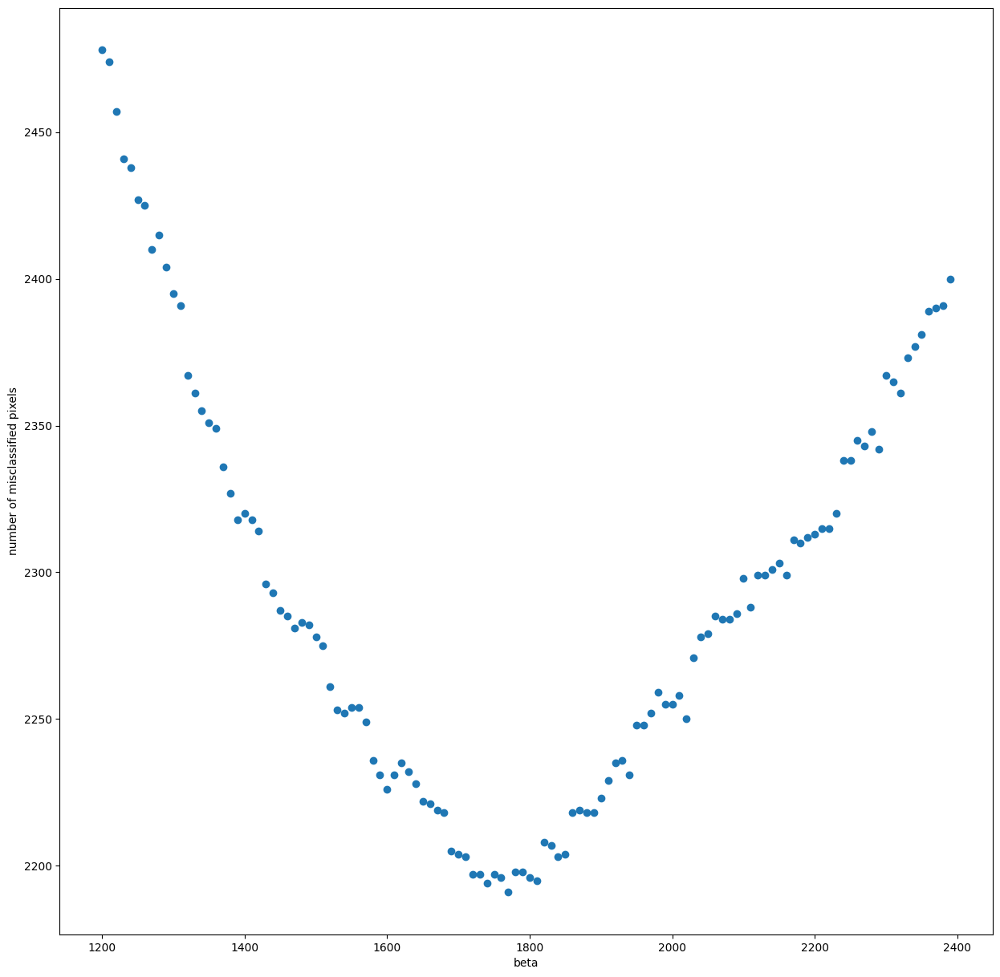

Best beta value:  1770


In [6]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in range(1200,2400,10):
    # TO BE COMPLETED
    m0 = np.mean(crop_classe0)
    m1 = np.mean(crop_classe1)

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    #TO BE COMPLETED
    error = np.sum(np.abs(im_bin - im_orig))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification with Ising model
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:

La modélisation des distributions des 2 classes est primordiale pour assurer une bonne attache aux données et donc une bonne classification.

Le choix de la valeur du paramètre de régularisation est important pour trouver un équilibre entre fidélité aux données et régularité des formes, assurant ainsi une bonne classification.

On peut voir que le résultat est globalement bon, on reconnait les formes des avions mais est très sensible au bruit ce qui est mauvais pour la classification.

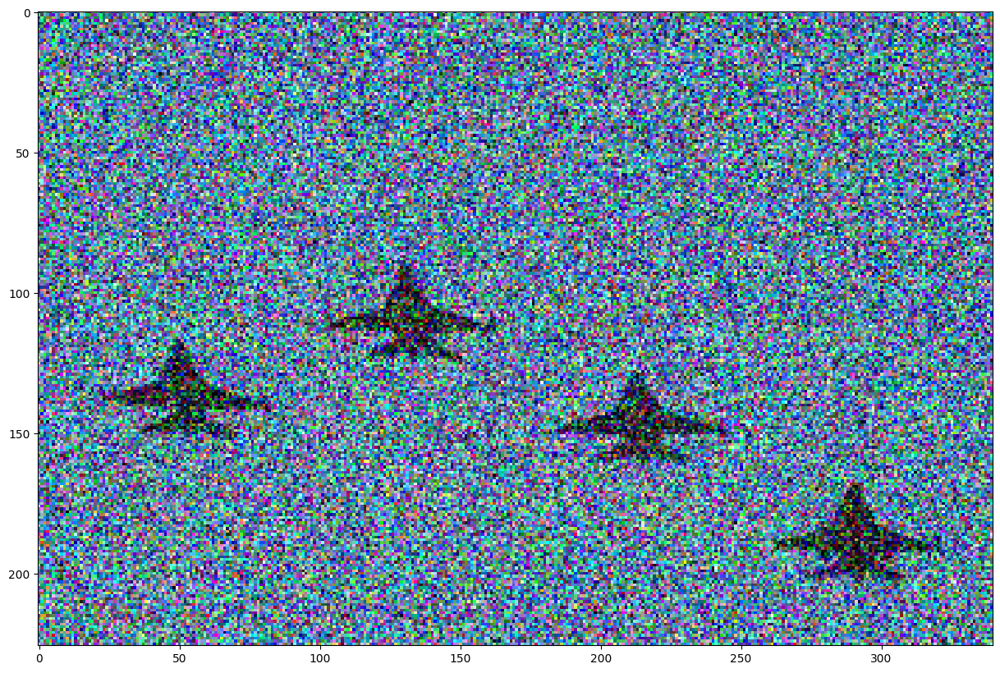

In [7]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()


#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example 1: np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1.

example 2: np.mean(image[180:200,280:300,:], axis=(0, 1)) returns the average over the two first axis (height and width) of the selected area, which is here a np.array of size (3,).

In [8]:
# mean of the plane class - 3D vector
# you can use values in the following square [180:200,280:300]
# TO BE COMPLETED
m_planes = np.mean(im_planes[180:200,280:300,:], axis=(0, 1))

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky =  np.mean(im_planes[0:100,150:300], axis=(0, 1))

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [ 93.96126667 127.14426667 156.2286    ]
For the planes, [R,G,B] =  [53.645  56.4725 70.2075]


In [49]:
# Choose a beta value
# TO BE COMPLETED
beta = 1770.

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the quadratic
# distance to the mean value of each class

g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(im_planes.shape[:2])
g.add_grid_edges(nodeids, beta)
map_Us_0 = np.sum((im_planes - m_planes)**2,axis=2)
map_Us_1 = np.sum((im_planes - m_sky)**2, axis=2)
g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)
flow = g.maxflow()

print("Max Flow:", str(flow))
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


Max Flow: 1013432685.9709368


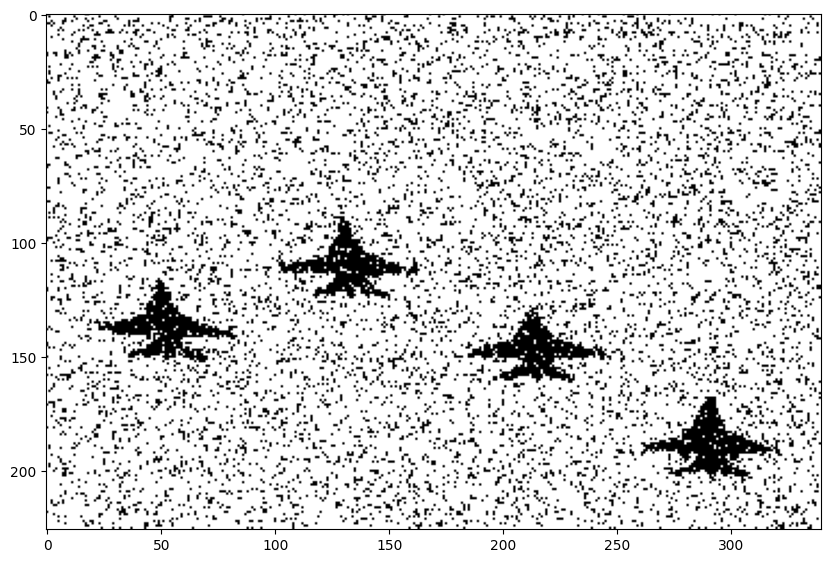

In [50]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin,cmap='grey')

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10:

En symétrisant l'image, on assure la continuité aux bords au lieu de simplement périodiser, ce qui entrainerait des discontinuités et donc des gradients importants sur les bords. Convoluer par un noyau gaussien permet de moyenner l'image et donc de réduire le bruit qui serait ensuite décuplé par le filtre de sobel, réduisant la visibilité des contours des avions.

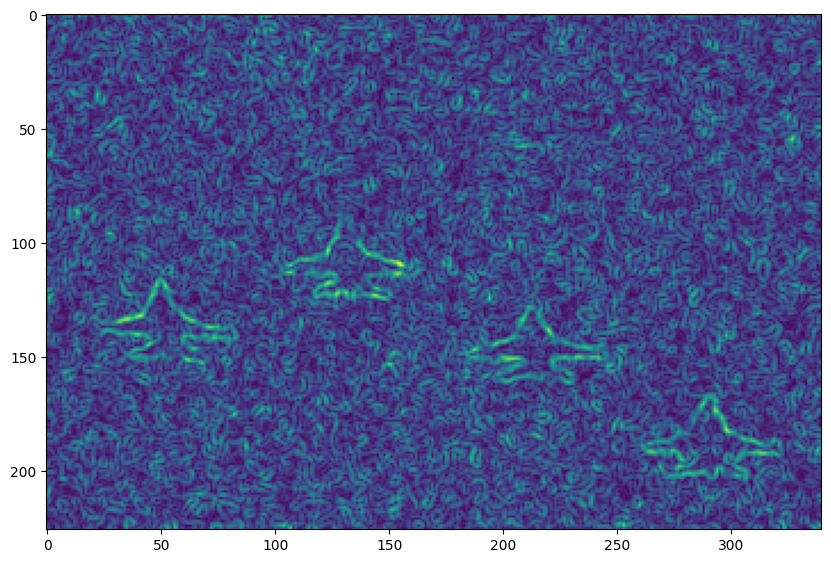

In [52]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = scipy.signal.convolve2d(image,sobel_x,mode='same',boundary='symm')
    derivative_y = scipy.signal.convolve2d(image,sobel_y,mode = 'same',boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av)
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$. We can use $h=3$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11:

On remarque que les résultats sont bien meilleurs avec le terme de contours. En effet, beta_field est plus faible aux endroits de gradient élevé donc proche des contours, ce qui favorise une coupure du graph sur ces arcs. A l'inverse, dans les zones de gradient faible, le coût d'un changement de classe entre 2 pixels adjacents est bien plus grand, ce qui réduit l'influence du bruit dans la classification.

Max Flow: 1092810990.4469407


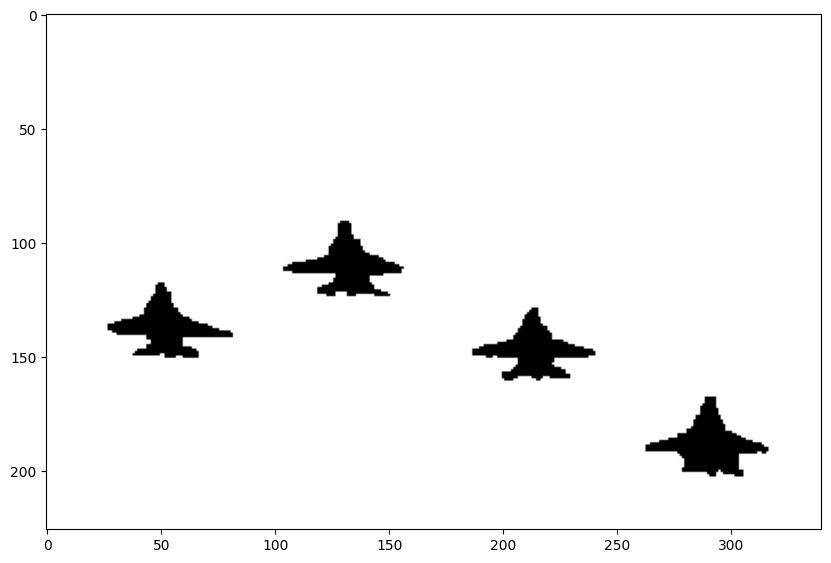

In [28]:
# Calculation of beta_field.
# This field will define the value for 4-neighborhood
# TO BE COMPLETED
h = 3
beta2 = 20000
beta_field = beta2 * np.exp(-grad_av/h)

# TO BE COMPLETED
## Binary graph-cut
# Complete by replacing beta with beta_field in your previous
# program on the line g.add_grid_edges

g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(im_planes.shape[:2])
g.add_grid_edges(nodeids, beta_field)
map_Us_0 = np.sum((im_planes - m_planes)**2,axis=2)
map_Us_1 = np.sum((im_planes - m_sky)**2, axis=2)
g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)
flow = g.maxflow()

print("Max Flow:", str(flow))
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin,cmap='grey')


## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12:

Il n'est pas possible de segmenter le zèbre avec la méthode précédente car cette dernière se base sur des segmentations de zones de couleur plutôt uniforme (l'attache des données se base sur une distribution quasi gaussienne autour de la valeur moyenne de chaque classe). Tandis que le zèbre est constitué de blanc (plus clair que le fond) et de noir (plus foncé que le fond), on ne peut donc pas directement rattacher les pixels à une moyenne du zèbre car il y a de grandes chances que le fond soit plus proche de cette moyenne que les pixels du zèbre lui-même.

uint8


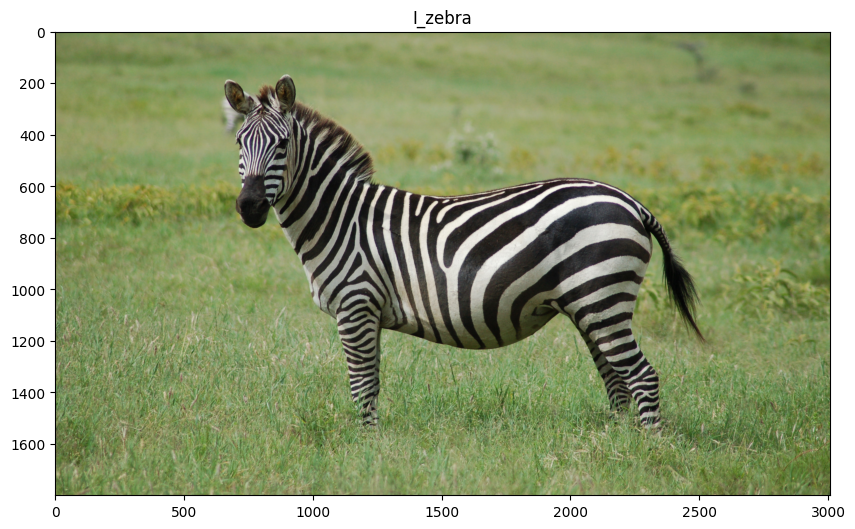

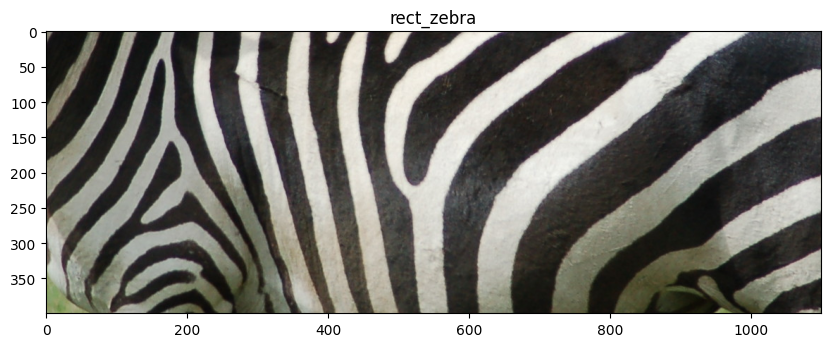

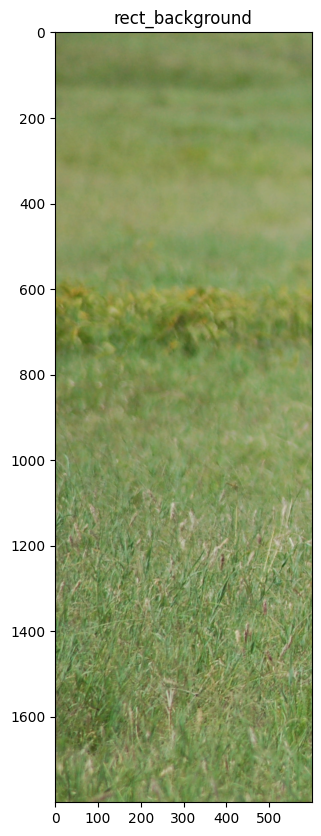

In [29]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13:

On peut voir que les valeurs de la matrice de covariance du zèbre sont beaucoup plus proches (relativement) que celles du fond. Ainsi les canaux du zèbre sont plus fortement corrélés que ceux du fond, ce qui s'explique par le fait que le noir correspond à des valeurs faibles sur tous les canaux et le blanc des valeurs fortes ce qui n'est pas le cas pour le vert du fond.

Les valeurs des diagonales correspondent aux variances de chaque canal RBG.

In [32]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14:

En effet, on remarque que les canaux ont des histogrammes quasiment identiques (ce qui n'est pas le cas pour le fond) et qu'il y a un gros pic proche de 0 pour chaque canal, ce qui correspond aux bandes noires du zèbre, très peu de pixels entre 90 et 150 et enfin beaucoup de pixels au dessus de 150 ce qui correspond aux bandes blanches (pic plus étalé car les ombres ternissent les rayures blanches)

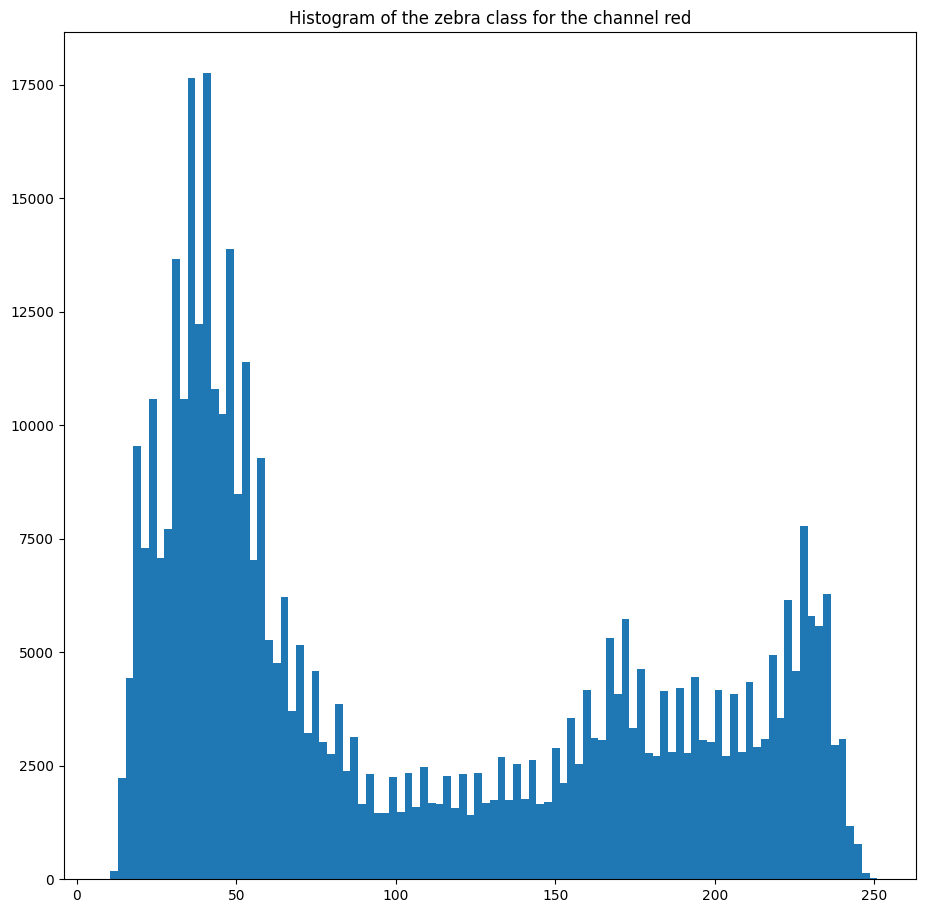

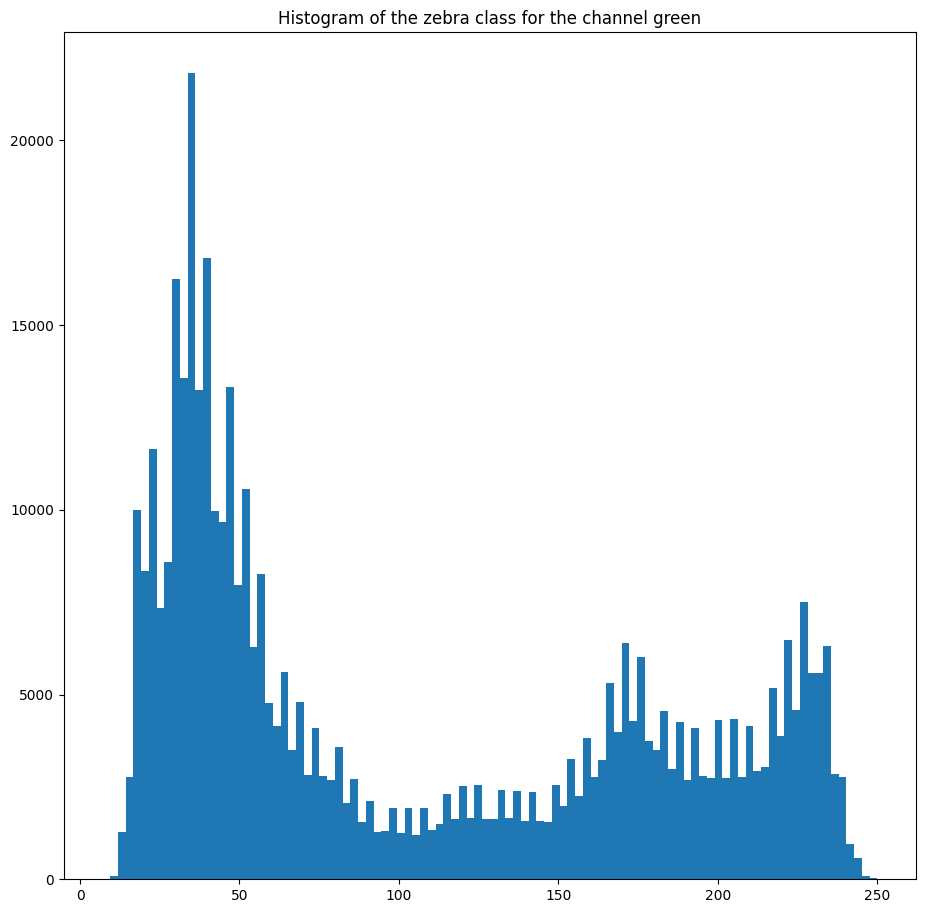

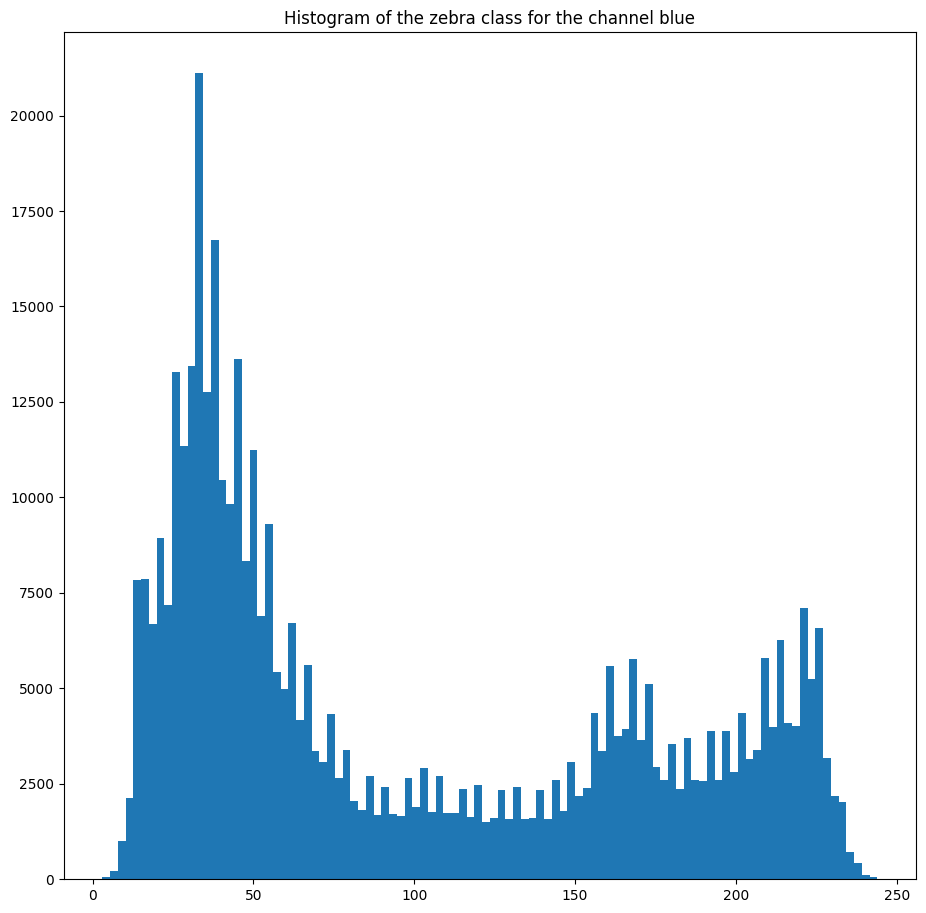

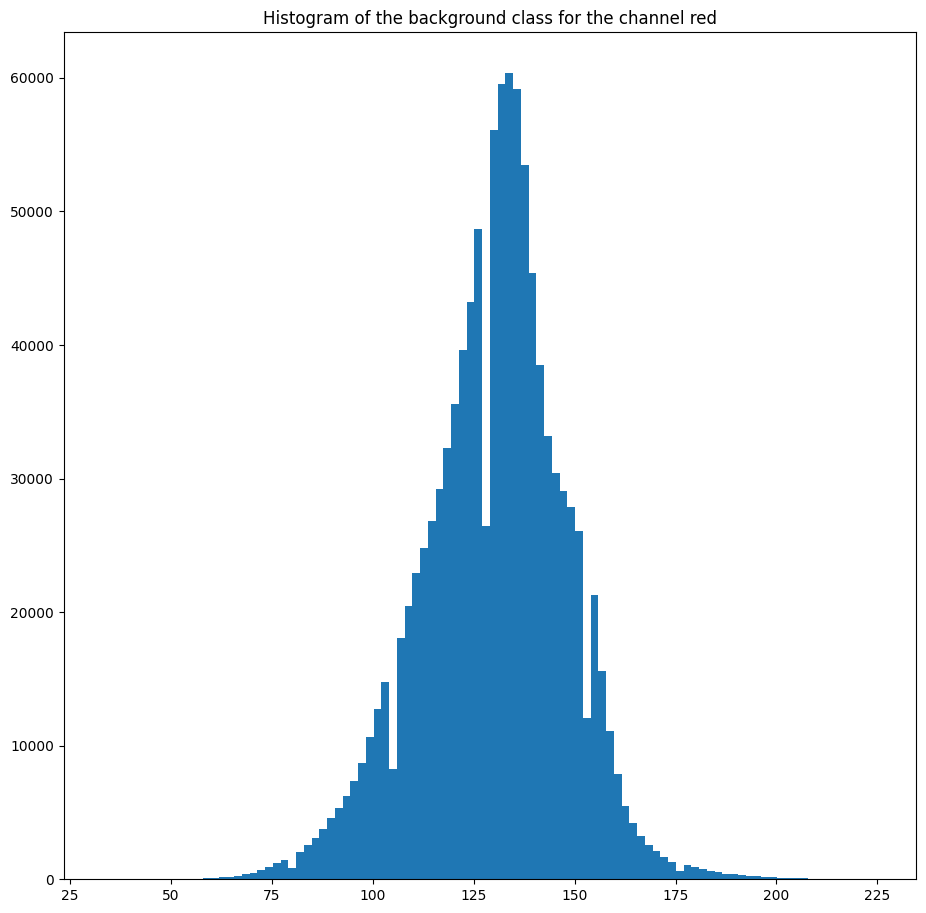

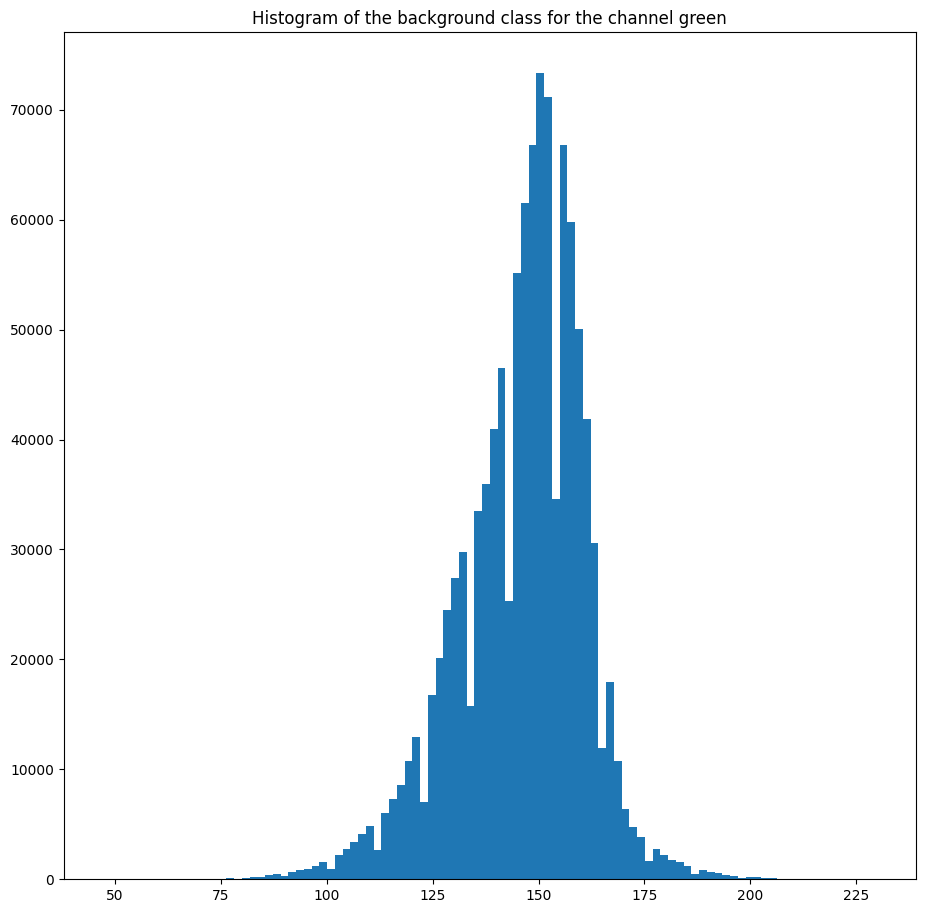

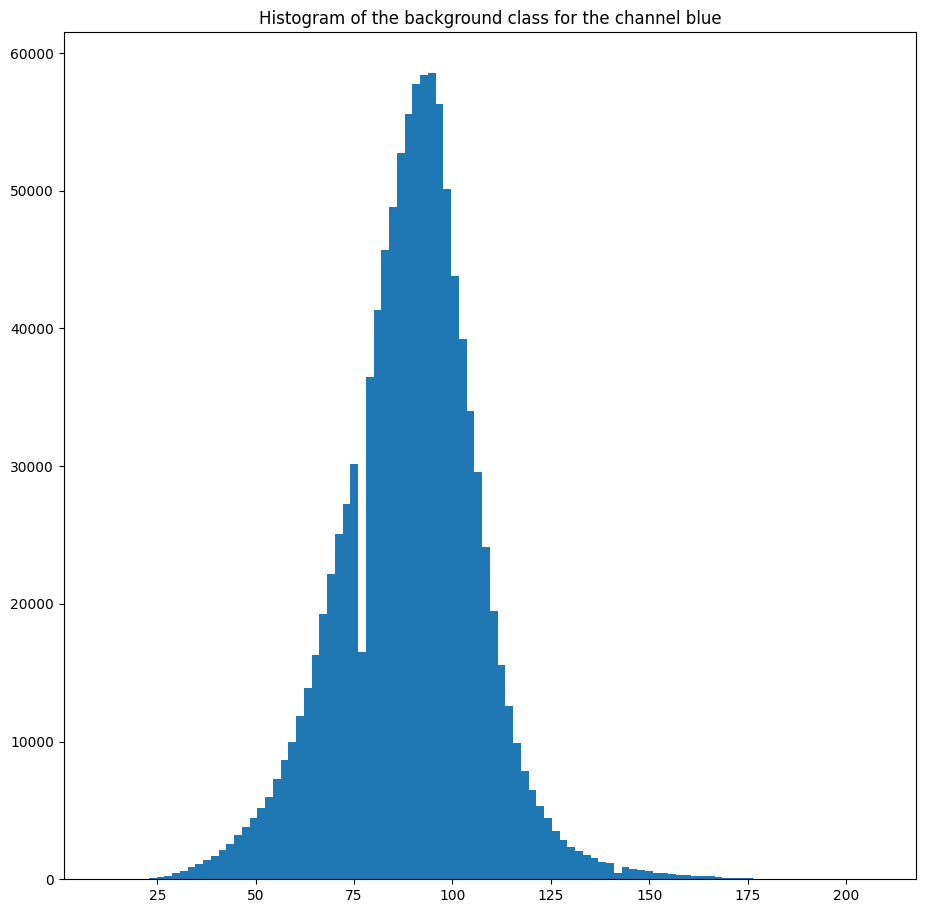

In [33]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15:

On décide donc de classifier le zèbre et le fond chacuns en 2 sous classes, notamment pour identifier les parties noires et blanches du zèbre. On utilise l'algorithme des K-moyennes avec 2 clusters pour chacune des 2 images pour identifier les moyennes de ces sous classes (moyennes pour chaque canal).

On remarque qu'on a effectivement réussi à identifier les moyennes des 2 classes du zèbre : un gris très foncé qui représente les rayures noires et un gris clair pour les rayures blanches. On a également 2 tons de vert pour le fond, un vert claire et un vert foncé.

In [34]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

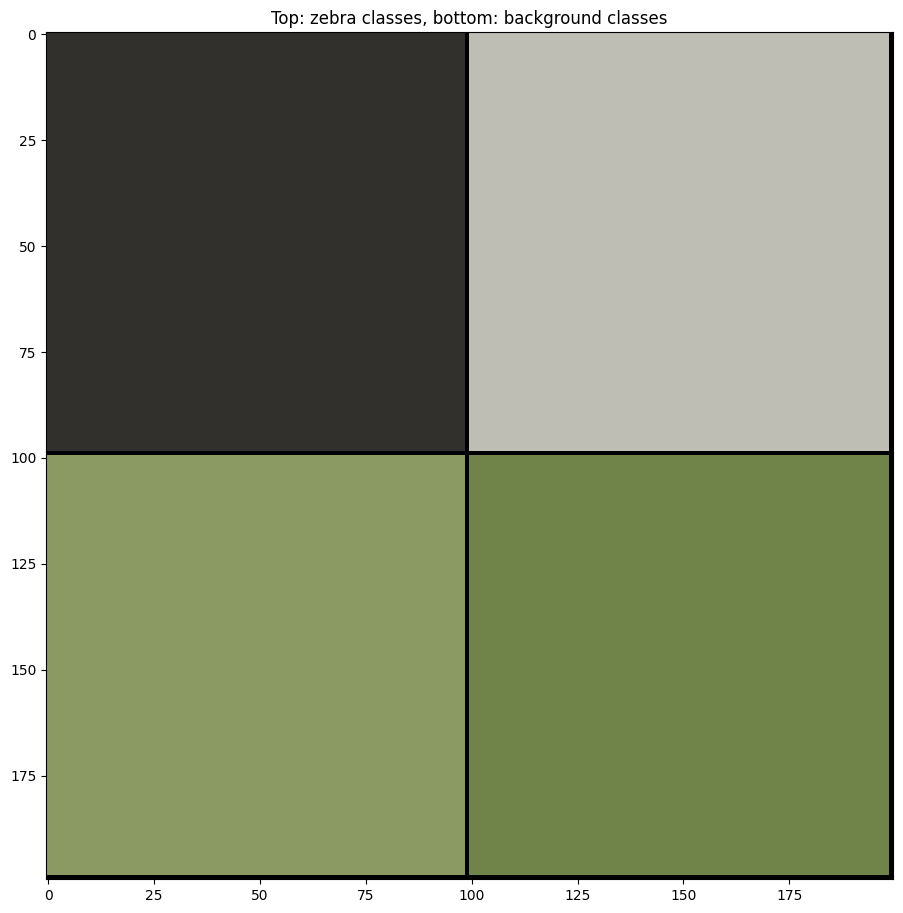

In [35]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16:

On remarque que l'on obtient des images très foncées sur les parties qui nous intéressent et blanches sur le reste. En effet en appliquant des échelles logarithmiques sur la ressemblance de chaque sous classe, on obtient uniquement les pixels qui nous intéressent pour chaque sous classe puis il ne reste qu'à les fusionner 2 à 2 pour obtenir de bons attachements aux données.

Cependant on remarque que certains pixels blancs (les plus foncés à cause des ombres) du zèbre sont tout de même présents dans le fond et inversement.

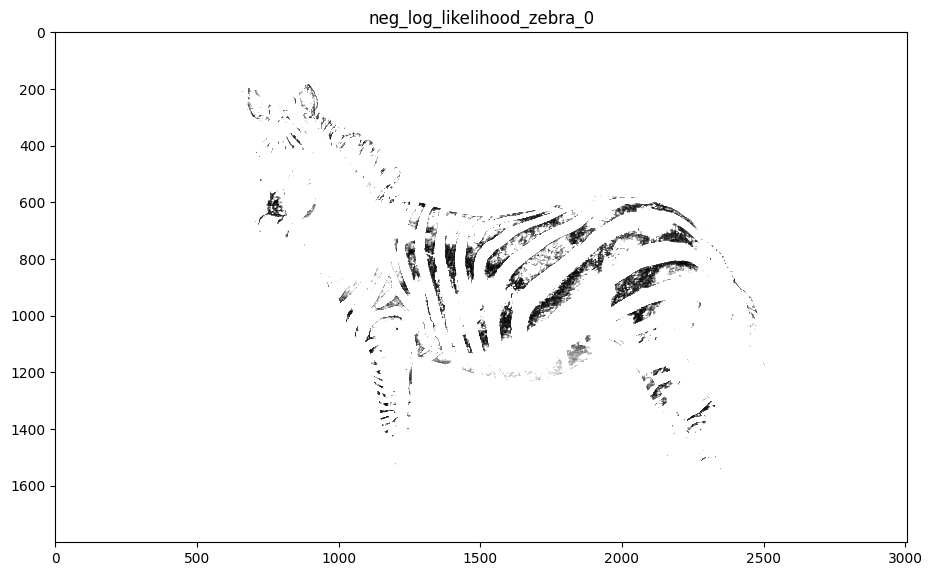

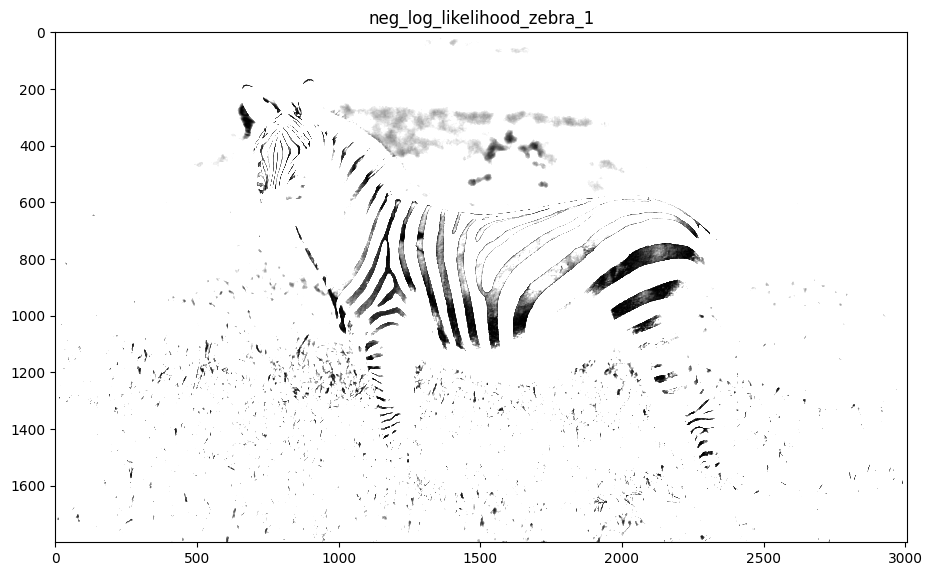

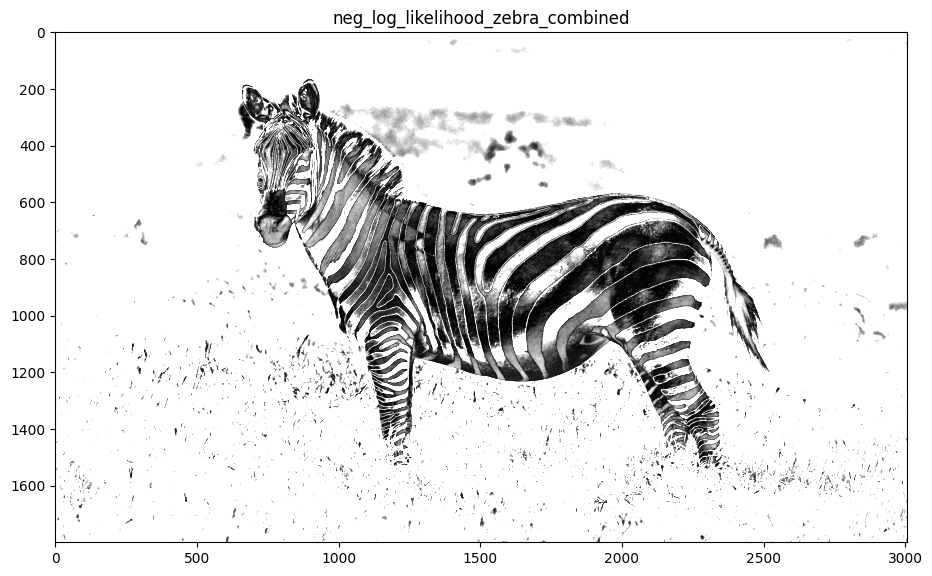

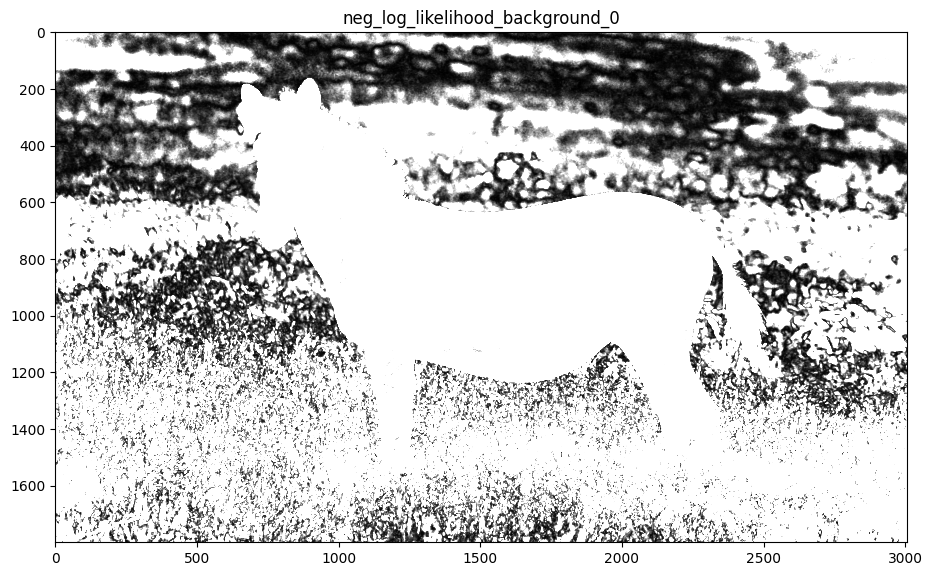

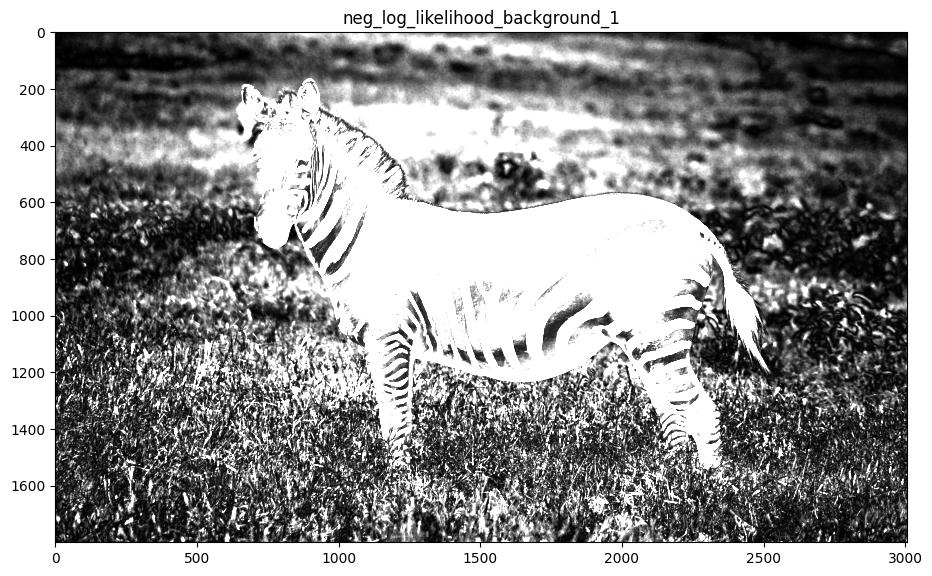

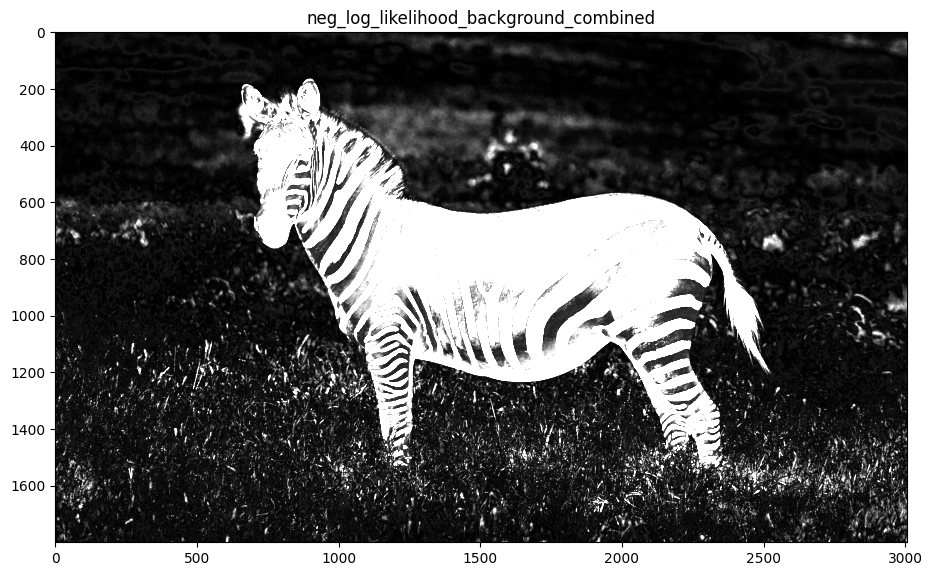

In [36]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(neg_log_likelihood_zebra_0,neg_log_likelihood_zebra_1)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
# call the output neg_log_likelihood_background_combined

neg_log_likelihood_background_0 = sum((I_zebra[:,:,i]-mean_vectors_background[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

neg_log_likelihood_background_combined = np.minimum(neg_log_likelihood_background_0,neg_log_likelihood_background_1)

plt.figure()
plt.imshow(neg_log_likelihood_background_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()



Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17:

On obtient effectivement une très bonne classification du zèbre et du fond. Cependant, comme nous l'avons identifié dans la question précédente, malgré un $\beta$ quasi optimal assurant une bonne régularité, certaines parties blanches très sombres du zèbre sont classifiées comme fond et une partie très claire du fond est classifiée comme zèbre.

Max Flow: 6154026170.735907


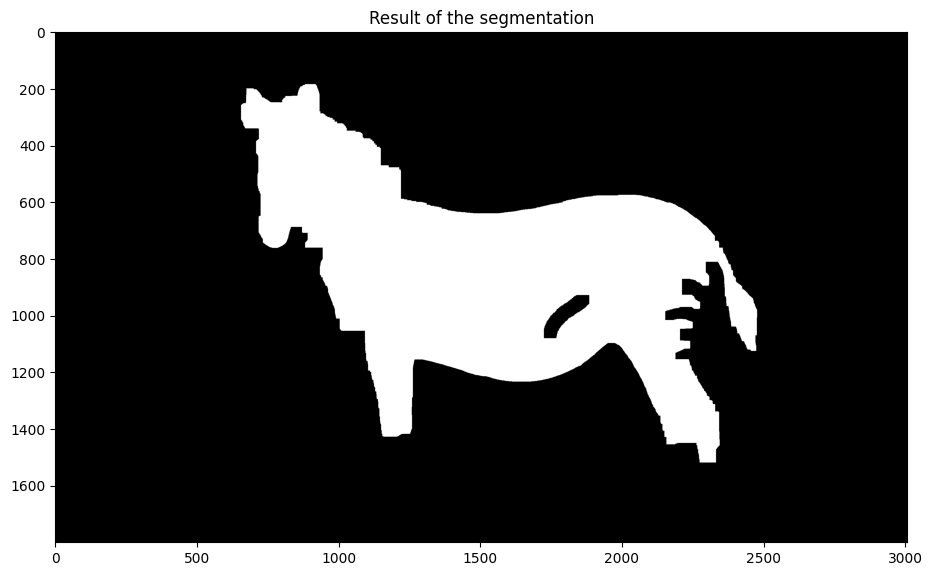

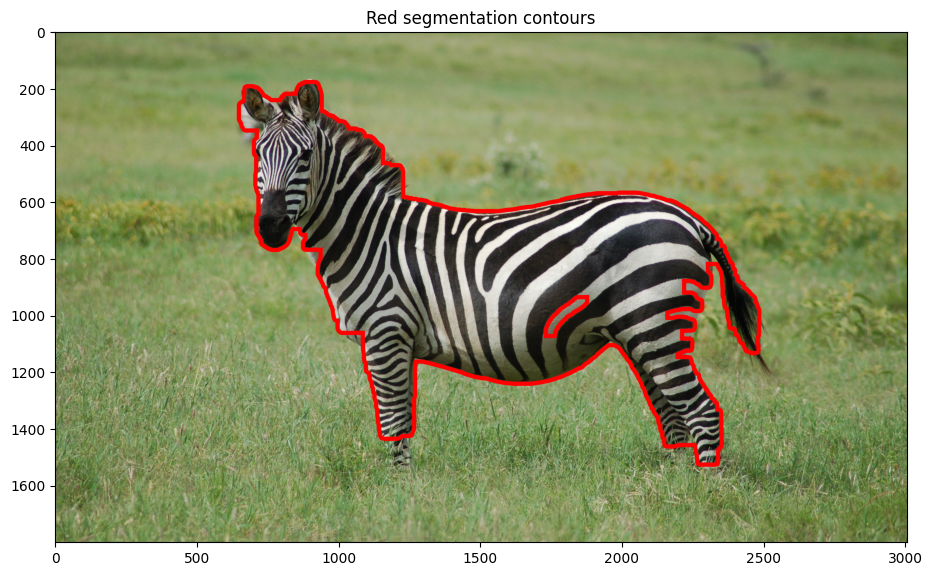

In [44]:
beta = 120000. # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids, neg_log_likelihood_background_combined, neg_log_likelihood_zebra_combined)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin,cmap='grey')
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18:

En prenant maintenant 5 classes et en se basant sur la première classification qui donne déjà une excellente initialisation, on arrive à beaucoup mieux séparer les différentes variations de couleurs d'une même classe (par exemple blanc et blanc foncé) ce qui évite d'avoir des ressemblances entre des parties du zèbre et le fond et inversement.

On obtient alors des neg-log-likelihood plus uniformes sur le zèbre et le fond avec des différences toujours très marquées.

In [45]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

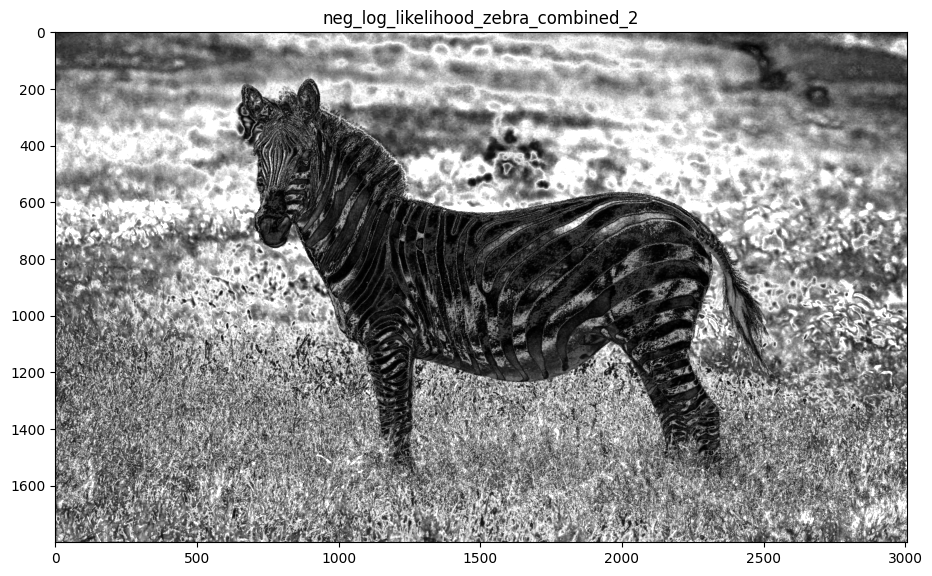

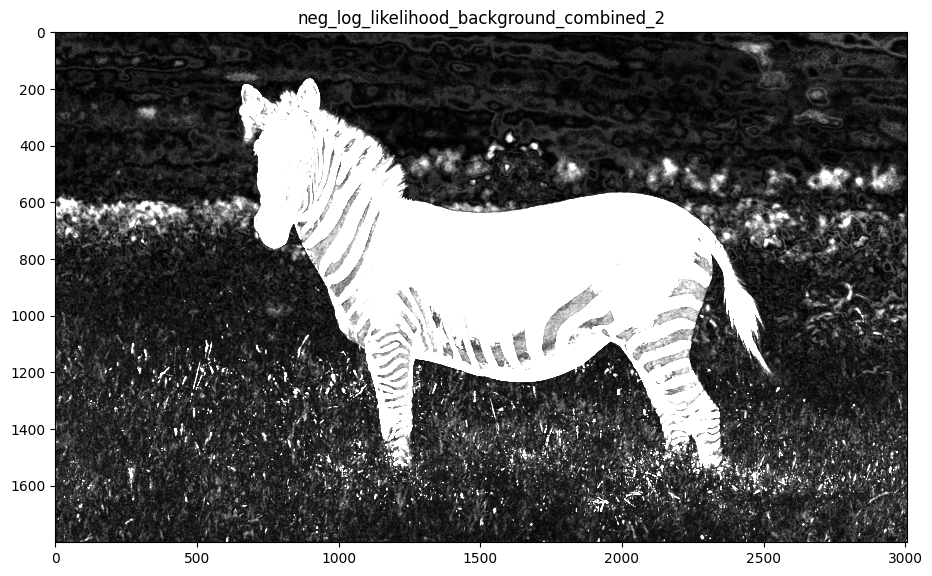

In [46]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19:

On obtient une bien meilleure segmentation, plus aucune partie du zèbre n'est classifiée comme fond, seulement quelques petites erreurs sur le fond qui est classifié comme zèbre.

La valeur de $\beta$ est divisée par 10 pour obtenir de bons résultats, une régularisation plus faible est nécessaire, on le remarque notamment sur les contours qui sont moins réguliers.

L'attachement aux données à 5 classe est donc plus efficace que la précédente à 2 classes.

Max Flow: 1454470801.884955


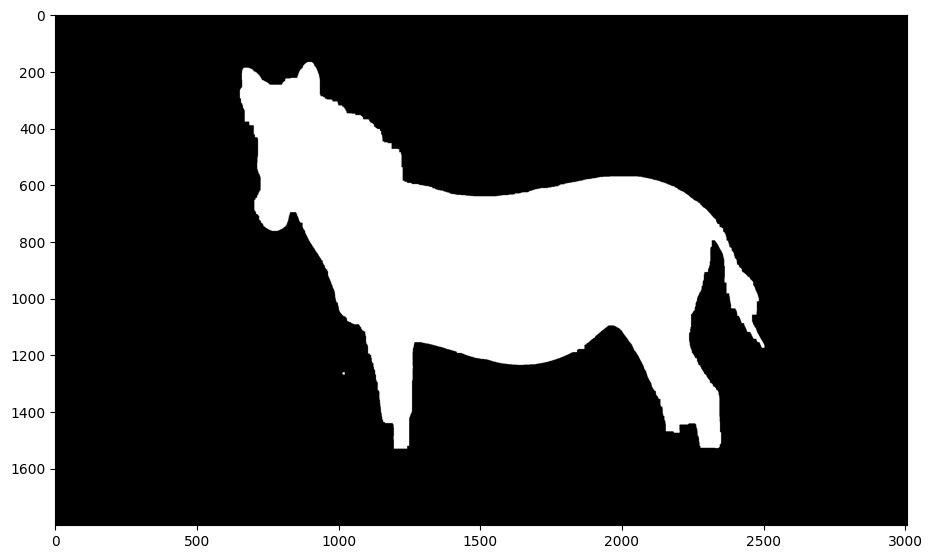

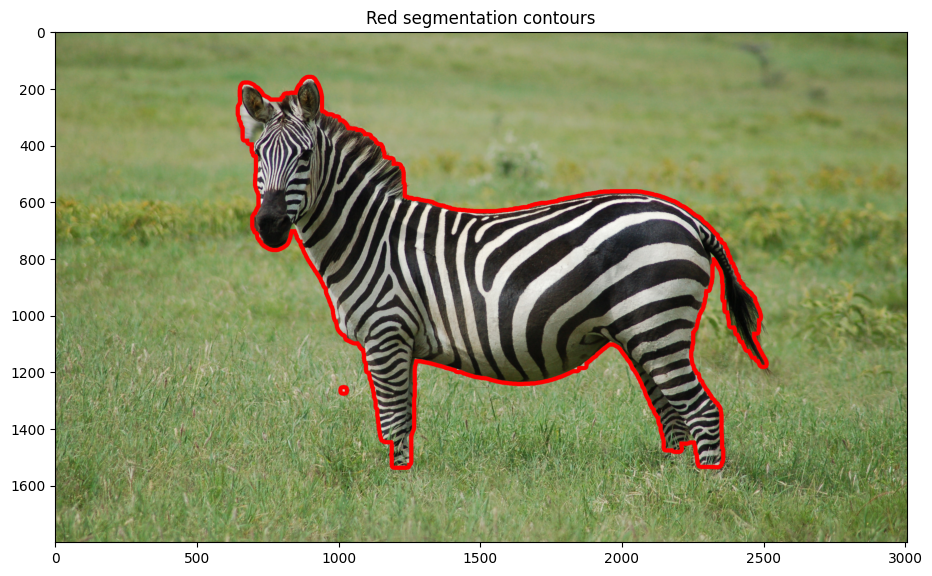

In [48]:
beta = 12000. # Optimal beta value to be determined

g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin,cmap='grey')
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()